# UMAP with ReducedMNN batch correction

In [1]:
here::i_am("01_create_arrow.R")
source(here::here("settings.R"))
source(here::here("load_archr.R"))
library(viridis)
library(batchelor)
library(uwot)

# I/O
io$outdir =  file.path(io$output.directory,"cluster_annotation")
dir.create(io$outdir, showWarnings = FALSE)

# args
args = list()
args$matrix = 'PeakMatrix'

addArchRThreads(12)
options(repr.plot.width=15, repr.plot.height=10)


here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/04_rabbit_scATAC/code

Setting default number of Parallel threads to 1.

Setting addArchRVerbose = FALSE

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==

In [2]:
metadata = as.data.table(ArchRProject@cellColData, keep.rownames=T)

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


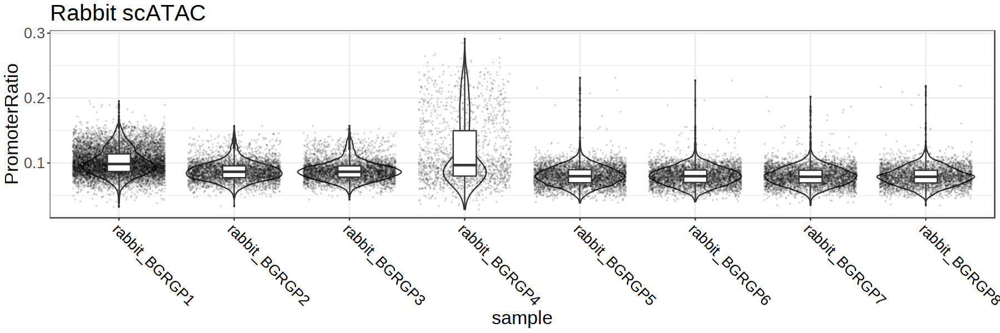

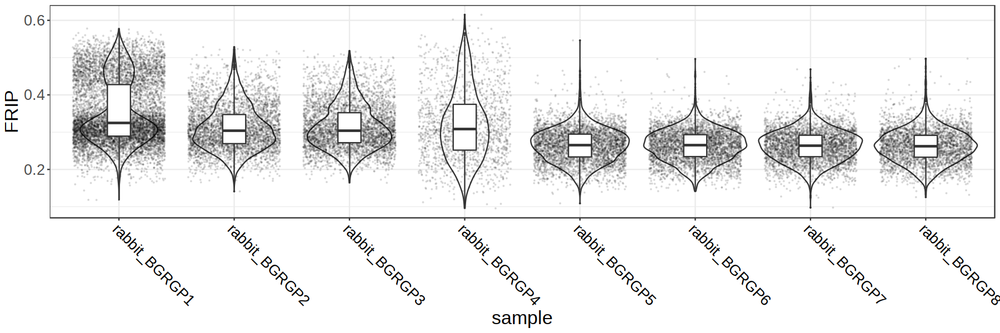

In [3]:
options(repr.plot.width=15, repr.plot.height=5)

ggplot(metadata, aes(sample, PromoterRatio)) + 
    geom_violin() + 
    geom_point(position=position_jitter(width=0.4), size=0.1, alpha=0.1) + 
    geom_boxplot(width = 0.2, outlier.size=0) + 
    ggtitle('Rabbit scATAC') + 
    theme_bw() + 
    theme(text=element_text(size=20, color='black'), 
          axis.text.x=element_text(angle=-45, hjust=0, vjust=1, color='black'))

ggplot(metadata, aes(sample, FRIP)) + 
    geom_violin() + 
    geom_point(position=position_jitter(width=0.4), size=0.1, alpha=0.1) + 
    geom_boxplot(width = 0.2, outlier.size=0) + 
    theme_bw() +
    theme(text=element_text(size=20, color='black'), 
          axis.text.x=element_text(angle=-45, hjust=0, vjust=1, color='black'))


In [ ]:
metadata = as.data.table(ArchRProject@cellColData, keep.rownames=T) %>%
    .[,stage_batch:=ifelse(stage=='GD9_ExE', 'GD9', stage)]

In [ ]:
lsi.mtx <- getReducedDims(ArchRProject, "PeakMatrix")

In [ ]:
lsi.list = lapply(c('GD9', 'GD8', 'GD7'), function(x){
    cells = metadata[stage_batch==x,cell]
    lsi.tmp = lsi.mtx[cells,]
    return(lsi.tmp)
})
    
lsi.correct = lsi.mtx <- reducedMNN(lsi.list, merge.order=1:length(lsi.list))$corrected 

In [ ]:
lsi.correct = lsi.correct[match(metadata$cell, rownames(lsi.correct)),]

In [ ]:
umap_embedding.mtx <- umap(lsi.correct, n_neighbors=25, min_dist=0.3, metric="cosine") %>% round(2)

In [ ]:
meta_umap = cbind(metadata, umap_embedding.mtx[,c(1,2)]) %>% setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))

In [ ]:
plot_umap = function(column){
    meta_umap = meta_umap[,plot:=eval(parse(text=column))]
    
    labels = meta_umap[,list(median(UMAP1), median(UMAP2)), 
                                  by= plot] %>%
        setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))
        
    
ggplot(meta_umap, aes(UMAP1, UMAP2, col=plot)) +
    geom_point(size=1, alpha=0.8) + 
    scale_color_manual(values = as.vector(c(ArchRPalettes[[3]],ArchRPalettes[[5]], ArchRPalettes[[8]],ArchRPalettes[[9]]))[1:length(unique(meta_umap$plot))]) + 
    ggrepel::geom_label_repel(data=labels, 
                                aes(label=plot, color=plot), 
                                max.overlaps=Inf,
                                box.padding = 0.4) + 
    theme_void() + 
    theme(legend.position='none')
}

In [ ]:
plot_umap('celltype_v1')

In [ ]:
umap = as.data.frame(umap_embedding.mtx)
colnames(umap) = c('test#umap1', 'test#umap2')
ArchRProject@embeddings$test$df = umap

In [ ]:
lapply(c("Dnmt3b", "Cdh5"), function(gene){ # ,  'Foxa2', 'Ptn', 'Eomes', 'Hoxa11', 'Hoxb9'
plotEmbedding(
    ArchRProj = ArchRProject, 
  embedding = "test",
  colorBy = 'GeneScoreMatrix',
  name = gene) + theme_void()
    })

In [104]:
order(-table(metadata$sample))

[1] 1 3 2 5 6 7 8 4

In [105]:
table(metadata$sample)


rabbit_BGRGP1 rabbit_BGRGP2 rabbit_BGRGP3 rabbit_BGRGP4 rabbit_BGRGP5 
         8750          4082          4336          1629          4064 
rabbit_BGRGP6 rabbit_BGRGP7 rabbit_BGRGP8 
         3994          3771          3456 

[1] "rabbit_BGRGP1" "rabbit_BGRGP3" "rabbit_BGRGP2" "rabbit_BGRGP5"
[5] "rabbit_BGRGP6" "rabbit_BGRGP7" "rabbit_BGRGP8" "rabbit_BGRGP4"

In [107]:
lsi.list = lapply(unique(metadata$sample)[order(-table(metadata$sample))], function(x){
    cells = metadata[sample==x,cell]
    lsi.tmp = lsi.mtx[cells,]
    return(lsi.tmp)
})
    
lsi.correct = lsi.mtx <- reducedMNN(lsi.list, merge.order=1:length(lsi.list))$corrected 

In [108]:
lsi.correct = lsi.correct[match(metadata$cell, rownames(lsi.correct)),]

In [109]:
umap_embedding.mtx <- umap(lsi.correct, n_neighbors=25, min_dist=0.3, metric="cosine", fast_sgd = TRUE) %>% round(2)

In [110]:
meta_umap = cbind(metadata, umap_embedding.mtx[,c(1,2)]) %>% setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))

In [111]:
plot_umap = function(column){
    meta_umap = meta_umap[,plot:=eval(parse(text=column))]
    
    labels = meta_umap[,list(median(UMAP1), median(UMAP2)), 
                                  by= plot] %>%
        setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))
        
    
ggplot(meta_umap, aes(UMAP1, UMAP2, col=plot)) +
    geom_point(size=1, alpha=0.8) + 
    scale_color_manual(values = as.vector(c(ArchRPalettes[[3]],ArchRPalettes[[5]], ArchRPalettes[[8]],ArchRPalettes[[9]]))[1:length(unique(meta_umap$plot))]) + 
    ggrepel::geom_label_repel(data=labels, 
                                aes(label=plot, color=plot), 
                                max.overlaps=Inf,
                                box.padding = 0.4) + 
    theme_void() + 
    theme(legend.position='none')
}

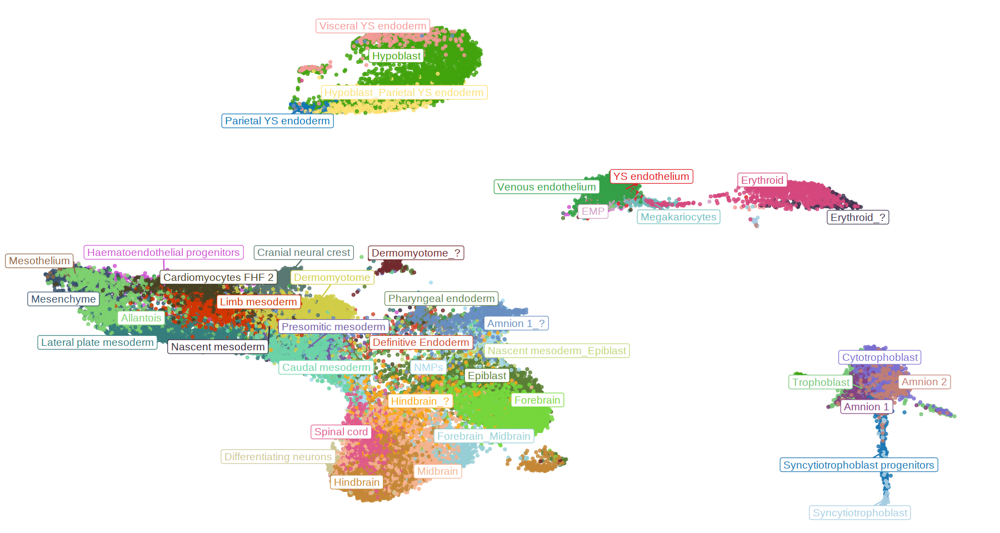

In [112]:
plot_umap('celltype_v1')

In [113]:
umap = as.data.frame(umap_embedding.mtx)
colnames(umap) = c('test#umap1', 'test#umap2')
ArchRProject@embeddings$test$df = umap

Getting ImputeWeights

2022-11-17 14:23:37 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:23:45 : SuppressedMessaged due to getArchRVerbose() is FALSE!



[[1]]

[[2]]


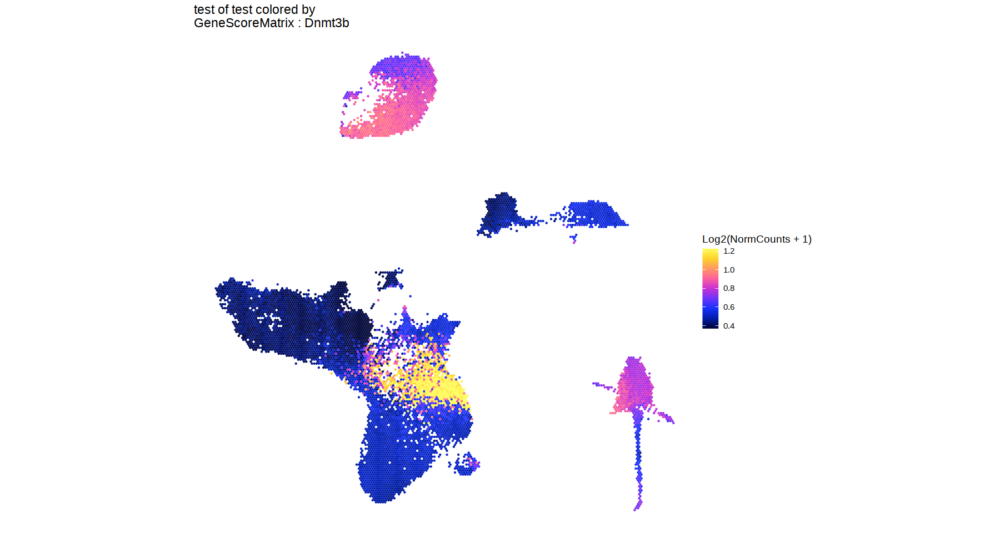

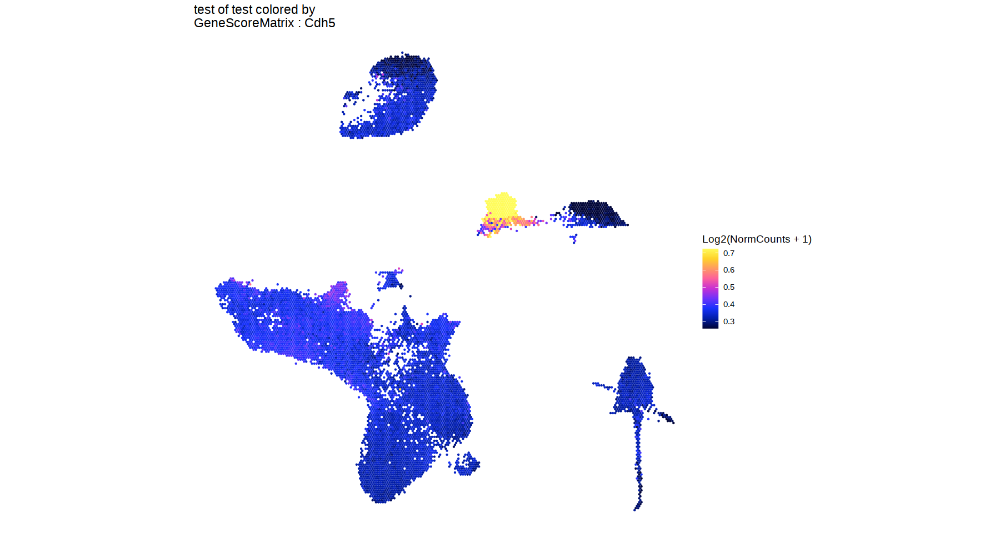

In [114]:
lapply(c("Dnmt3b", "Cdh5"), function(gene){ # ,  'Foxa2', 'Ptn', 'Eomes', 'Hoxa11', 'Hoxb9'
plotEmbedding(
    ArchRProj = ArchRProject, 
  embedding = "test",
  colorBy = 'GeneScoreMatrix',
  name = gene) + theme_void()
    })

# Embryo proper only

In [1]:
here::i_am("01_create_arrow.R")
source(here::here("settings.R"))
ArchRProject <- loadArchRProject('/rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Embryo_proper')

library(viridis)
library(batchelor)
library(uwot)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/04_rabbit_scATAC/code

Setting default number of Parallel threads to 1.

Setting addArchRVerbose = FALSE

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==

In [2]:
ArchRProject@geneAnnotation$TSS

GRanges object with 38003 ranges and 2 metadata columns:
                     seqnames    ranges strand |     tx_id            tx_name
                        <Rle> <IRanges>  <Rle> | <integer>        <character>
  ENSOCUG00000014251     chr1     15188      + |         1 ENSOCUT00000014253
  ENSOCUG00000014251     chr1     20324      + |         2 ENSOCUT00000038745
  ENSOCUG00000005054     chr1     52453      + |         3 ENSOCUT00000005053
  ENSOCUG00000005044     chr1     75200      + |         4 ENSOCUT00000005041
  ENSOCUG00000005028     chr1    125890      + |         5 ENSOCUT00000005032
                 ...      ...       ...    ... .       ...                ...
  ENSOCUG00000000255     chrX 111369675      - |     37999 ENSOCUT00000000255
  ENSOCUG00000007220     chrX 111496239      - |     38000 ENSOCUT00000007220
  ENSOCUG00000019315     chrX 111494835      - |     38001 ENSOCUT00000019315
  ENSOCUG00000022547     chrX 111532815      - |     38002 ENSOCUT00000023399
  ENSOC

In [3]:
metadata = as.data.table(ArchRProject@cellColData, keep.rownames=T) %>%
    .[,stage_batch:=ifelse(stage=='GD9_ExE', 'GD9', stage)]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


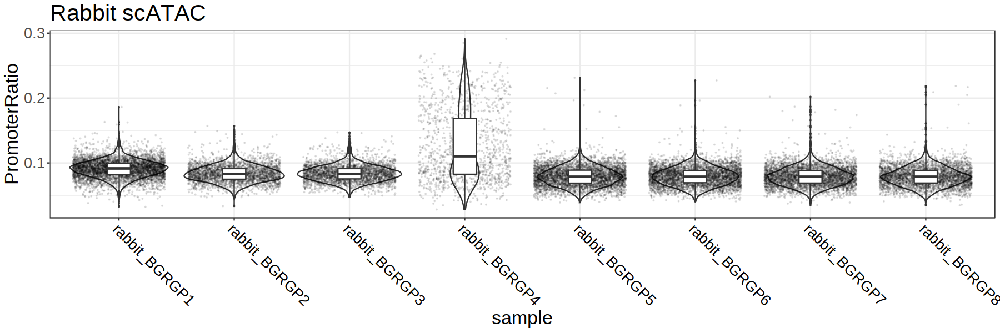

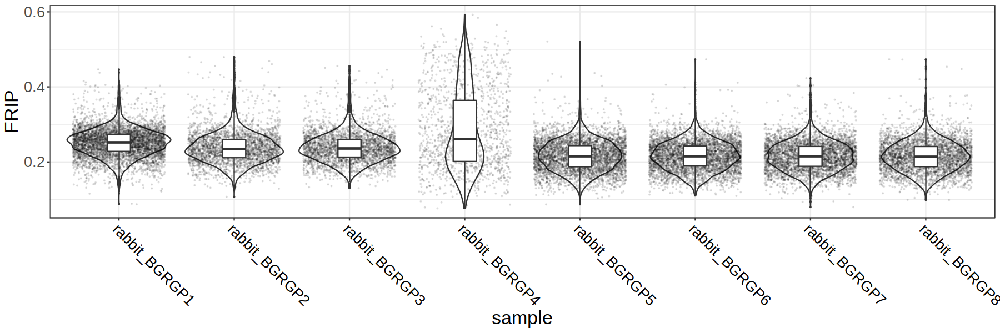

In [4]:
options(repr.plot.width=15, repr.plot.height=5)

ggplot(metadata, aes(sample, PromoterRatio)) + 
    geom_violin() + 
    geom_point(position=position_jitter(width=0.4), size=0.1, alpha=0.1) + 
    geom_boxplot(width = 0.2, outlier.size=0) + 
    ggtitle('Rabbit scATAC') + 
    theme_bw() + 
    theme(text=element_text(size=20, color='black'), 
          axis.text.x=element_text(angle=-45, hjust=0, vjust=1, color='black'))

ggplot(metadata, aes(sample, FRIP)) + 
    geom_violin() + 
    geom_point(position=position_jitter(width=0.4), size=0.1, alpha=0.1) + 
    geom_boxplot(width = 0.2, outlier.size=0) + 
    theme_bw() +
    theme(text=element_text(size=20, color='black'), 
          axis.text.x=element_text(angle=-45, hjust=0, vjust=1, color='black'))


In [5]:
peak.mtx = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "PeakMatrix")

In [ ]:
reads_in_peaks = data.table(cell=colnames(peak.mtx), ReadsInPeaks=colSums(peak.mtx@assays@data$PeakMatrix))
reads_in_peaks = reads_in_peaks[match(metadata$cell, reads_in_peaks$cell)]

meta2 = cbind(metadata[,c('sample','nFrags')], reads_in_peaks[,2])
meta2 = meta2[,FRIP:=ReadsInPeaks/nFrags]

ggplot(meta2, aes(sample, FRIP)) + 
    geom_boxplot() + 
    geom_point(position=position_jitter(width=0.4), size=0.4, alpha=0.4) + 
    theme_bw()

In [6]:
metadata = as.data.table(ArchRProject@cellColData, keep.rownames=T) %>%
    .[,stage_batch:=ifelse(stage=='GD9_ExE', 'GD9', stage)]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [7]:
lsi.mtx <- getReducedDims(ArchRProject, "PeakMatrix")

In [8]:
lsi.list = lapply(c('GD9', 'GD8', 'GD7'), function(x){
    cells = metadata[stage_batch==x,cell]
    lsi.tmp = lsi.mtx[cells,]
    return(lsi.tmp)
})
    
lsi.correct = lsi.mtx <- reducedMNN(lsi.list, merge.order=1:length(lsi.list))$corrected 

In [9]:
lsi.correct = lsi.correct[match(metadata$cell, rownames(lsi.correct)),]

In [10]:
umap_embedding.mtx <- umap(lsi.correct, n_neighbors=25, min_dist=0.3, metric="cosine") %>% round(2)

In [11]:
meta_umap = cbind(metadata, umap_embedding.mtx[,c(1,2)]) %>% setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))

In [12]:
plot_umap = function(column){
    meta_umap = meta_umap[,plot:=eval(parse(text=column))]
    
    labels = meta_umap[,list(median(UMAP1), median(UMAP2)), 
                                  by= plot] %>%
        setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))
        
    
ggplot(meta_umap, aes(UMAP1, UMAP2, col=plot)) +
    geom_point(size=1, alpha=0.8) + 
    scale_color_manual(values = as.vector(c(ArchRPalettes[[3]],ArchRPalettes[[5]], ArchRPalettes[[8]],ArchRPalettes[[9]]))[1:length(unique(meta_umap$plot))]) + 
    ggrepel::geom_label_repel(data=labels, 
                                aes(label=plot, color=plot), 
                                max.overlaps=Inf,
                                box.padding = 0.4) + 
    theme_void() + 
    theme(legend.position='none')
}

In [14]:
umap = as.data.frame(umap_embedding.mtx)
colnames(umap) = c('test#umap1', 'test#umap2')
ArchRProject@embeddings$test$df = umap

In [15]:
ArchRProject = addImputeWeights(ArchRProject, 'PeakMatrix')

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [139]:
markersGS <- getMarkerFeatures(
    ArchRProj = ArchRProject, 
    useMatrix = "GeneScoreMatrix", 
    groupBy = "Clusters_PeakMatrix",
    bias = c("log10(nFrags)"),
    testMethod = "wilcoxon"
)

markerList <- getMarkers(markersGS, cutOff = "FDR <= 0.01 & Log2FC >= 1.25")

2022-11-18 15:01:44 : SuppressedMessaged due to getArchRVerbose() is FALSE!



In [56]:
markers = lapply(names(markerList), function(x){
    tmp = as.data.table(markerList[[x]]) %>% 
        .[c(1:4),c('name', 'Log2FC', 'FDR', 'MeanDiff')] %>%
        .[,celltype:=x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[!is.na(name),]
    

In [26]:
GeneScoreMatrix = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "GeneScoreMatrix")

In [35]:
genes = getFeatures(ArchRProject, 'GeneScoreMatrix') %>% stringr::str_split(':') %>% map_chr(2)

In [37]:
GeneScoreMtx = GeneScoreMatrix@assays@data$GeneScoreMatrix
rownames(GeneScoreMtx) = genes

In [38]:
GeneScoreMtx = GeneScoreMatrix

In [105]:
GeneScoreMtx_markers = GeneScoreMtx[markers$name, ] # only keep markers
GeneScoreMtx_markers = t(scale(t(GeneScoreMtx_markers))) # normalise

In [129]:
summary(GeneScoreMtx_markers[c(1),])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-0.8419 -0.6239 -0.2689  0.0000  0.2688 18.8459 

In [ ]:
# maybe normalise GSM first?

In [117]:
meta = as.data.table(ArchRProject@cellColData)

In [132]:
marker_stats = lapply(unique(meta$celltype_v1), function(x){
    cells = meta[celltype_v1 == x, cell]
    GSM_tmp = GeneScoreMtx_markers[,cells]

    tmp = data.table(gene = rownames(GSM_tmp),
                     celltype=x, 
                 #    cdr = rowSums(GSM_tmp >0)/dim(GSM_tmp)[2] * 100,
                     mean = rowMeans(GSM_tmp))
    return(tmp)
}) %>% rbindlist() %>% 
    .[,mean_capped := ifelse(mean>2, 2, mean)]

In [133]:
summary(marker_stats[,mean])

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-0.72022 -0.16950 -0.06481  0.01890  0.06246  4.28279 

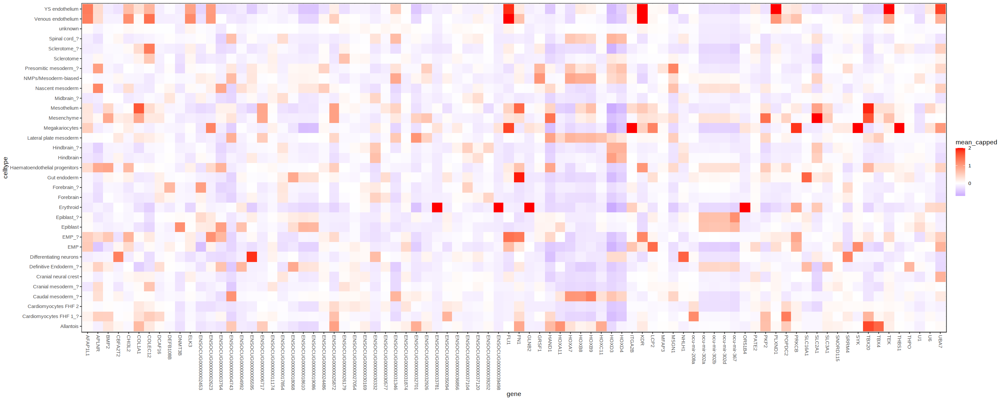

In [134]:
options(repr.plot.width=25, repr.plot.height=10)

ggplot(marker_stats, aes(gene, celltype, fill=mean_capped)) + 
    geom_tile() + 
    scale_fill_gradient2(low='blue', mid='white', high='red') +
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5))

In [ ]:
marker = lapply(unique(meta$celltype_v1), function(x){
    cells = meta[celltype_v1 == x, cell]
    GSM_tmp = GeneScoreMtx_markers[,cells]

    tmp = data.table(gene = rownames(GSM_tmp),
                     celltype=x, 
                 #    cdr = rowSums(GSM_tmp >0)/dim(GSM_tmp)[2] * 100,
                     mean = rowMeans(GSM_tmp))
    return(tmp)
}) %>% rbindlist() %>% 
    .[,mean_capped := ifelse(mean>2, 2, mean)]

In [69]:
rowSums(GeneScoreMtx_markers >0)/dim(GeneScoreMtx_markers)[2] * 100

TBX20               TBX4 ENSOCUG00000025872             HOXA11 
         84.968153          87.181959          76.849716          48.139095 
            POPDC2 ENSOCUG00000035094       ocu-mir-208a             DCAF16 
         58.323291          36.013083          42.038217          18.450680 
ENSOCUG00000031874 ENSOCUG00000036856 ENSOCUG00000030169 ENSOCUG00000027054 
         20.237562          14.501635          12.367017          12.205199 
             HOXB9 ENSOCUG00000004743              HOXB8              HOXA7 
         45.756585          72.811155          40.812532          49.140988 
ENSOCUG00000011174               UBA7              PATE2           SNORD115 
         27.240489          45.150628          11.678430           6.001033 
ENSOCUG00000004992               THPO ENSOCUG00000018068             SLC3A1 
         34.233087          32.256843          26.452057          59.314856 
             SRRM4 ENSOCUG00000005595              NHLH1            CBFA2T2 
         81.945257          66.087106          53.306938          82.730246 
              LCP2               FLI1                FN1                KDR 
         56.199002          92.480633          76.126700          82.998795 
ENSOCUG00000002623 ENSOCUG00000003764             DNMT3B ENSOCUG00000018610 
         65.319332          82.754347          67.164744          50.060251 
ENSOCUG00000019086        ocu-mir-367       ocu-mir-302a       ocu-mir-302d 
         49.196075          34.770184          25.608538          24.826993 
      ocu-mir-302b ENSOCUG00000039498              GLNB2 ENSOCUG00000033781 
         24.475813          35.524187          37.610604          39.135824 
            OR51B4 ENSOCUG00000039202 ENSOCUG00000002453           DEFB108B 
         38.571183          21.872956          79.032536          23.797556 
ENSOCUG00000037104                FN1            SLC16A1 ENSOCUG00000018068 
         20.096402          76.126700          81.573421          26.452057 
ENSOCUG00000030577             CHI3L2               BMP2                 U1 
         62.836977          53.417111          24.341539          81.556206 
                U1              HOXD3 ENSOCUG00000030332              HOXD4 
         81.556206          77.586504          46.875538          55.978654 
                U6 ENSOCUG00000030332 ENSOCUG00000032701              HOXA7 
         14.384576          46.875538          84.699604          49.140988 
            HOXC11 ENSOCUG00000006717              THBS1             ITGA2B 
         45.901188          15.265967          65.057669          51.272164 
             PRKCB                SYK             SLC2A1              TBX20 
         90.456189          79.700465          90.807368          84.968153 
              PKP2              HAND1              TBX20             COL1A1 
         89.013600          90.772939          84.968153          80.017215 
ENSOCUG00000037120              APLNR ENSOCUG00000024486                 U1 
         17.655362          75.658461          35.396798          81.556206 
             GRSF1              HOXA7 ENSOCUG00000031346              HOXB8 
         73.592701          49.140988          39.314856          40.812532 
             MSGN1 ENSOCUG00000032926              MFAP3 ENSOCUG00000026179 
         76.174901          13.744190          13.775176          49.089344 
           COLEC12 ENSOCUG00000017854               FLI1                KDR 
         92.990188          26.541573          92.480633          82.998795 
           AFAP1L1               ELK3             PLXND1               FLI1 
         68.149423          88.111551          81.728353          92.480633 
               KDR                TEK 
         82.998795          79.166810

[1] 29045

In [41]:
head(markers)

name,Log2FC,FDR,MeanDiff,celltype
<chr>,<dbl>,<dbl>,<dbl>,<chr>
TBX20,1.653620,7.833633e-78,1.3494063,Allantois
TBX4,1.546126,7.891118e-67,1.1932863,Allantois
ENSOCUG00000025872,1.328475,5.567622e-48,1.0087570,Allantois
HOXA11,1.608771,1.957046e-45,0.9975880,Allantois
POPDC2,1.605929,5.037560e-34,0.6265214,Cardiomyocytes FHF 1_?
ENSOCUG00000035094,1.446948,1.370089e-11,0.4798432,Cardiomyocytes FHF 1_?


In [21]:
markerList[['Allantois']]

DataFrame with 14 rows and 9 columns
      seqnames     start       end  strand               name     idx    Log2FC
         <Rle>   <array>   <array> <array>            <array> <array> <numeric>
2301     chr10  19002335  18945684       2              TBX20     149   1.65362
11440    chr19  27650224  27676178       1               TBX4     492   1.54613
19793     chr9  63524657  63524528       2 ENSOCUG00000025872     732   1.32848
2239     chr10  11903066  11900706       2             HOXA11      87   1.60877
8458     chr16   5837448   5846030       1 ENSOCUG00000039344      60   1.38425
...        ...       ...       ...     ...                ...     ...       ...
10988    chr19   6639146   6643827       1 ENSOCUG00000038165      40   1.39667
18515     chr8  28971237  28971657       1 ENSOCUG00000006717     250   1.41685
3421     chr12  21884767  21885705       1 ENSOCUG00000006836     299   1.51102
20357     chrX  30972972  30972910       2        ocu-mir-221     234   1.25213
148

Warning message:
“'markerHeatmap' is deprecated.
Use 'plotMarkerHeatmap' instead.
See help("Deprecated")”
Printing Top Marker Genes:

Allantois:

	chr1:ENSOCUG00000033576, chr1:ENSOCUG00000034458, chr10:HOXA11, chr10:COL1A2, chr12:ENSOCUG00000006836, chr16:ENSOCUG00000039344, chr19:TBX4, chrX:ocu-mir-221, chr19:ENSOCUG00000038165, chr19:ENSOCUG00000034820, chr4:HOXC11, chr9:ENSOCUG00000025872, chr10:TBX20, chr8:ENSOCUG00000006717, chr1:UGCG

Cardiomyocytes FHF 1_?:

	chr14:POPDC2, chr17:ocu-mir-208a, chr17:ENSOCUG00000035094, chr2:DCAF16, chr1:UGCG, chr1:TMEM245, chr1:ENSOCUG00000019002, chr1:ENSOCUG00000010701, chr1:CREB3, chr1:TLN1, chr1:ENSOCUG00000036968, chr1:TEK, chr1:ENSOCUG00000030169, chr1:U6, chr1:ENSOCUG00000018236

Cardiomyocytes FHF 2:

	chr1:ENSOCUG00000030169, chr1:ENSOCUG00000037379, chr1:ENSOCUG00000027054, chr1:ENSOCUG00000037885, chr2:ENSOCUG00000031874, chr21:ENSOCUG00000031864, chr9:ORYCUNV1R1532, chrX:ENSOCUG00000036856, chr1:UGCG, chr1:TMEM245, chr1:ENSOCUG000000

[1] "TAL1"


Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



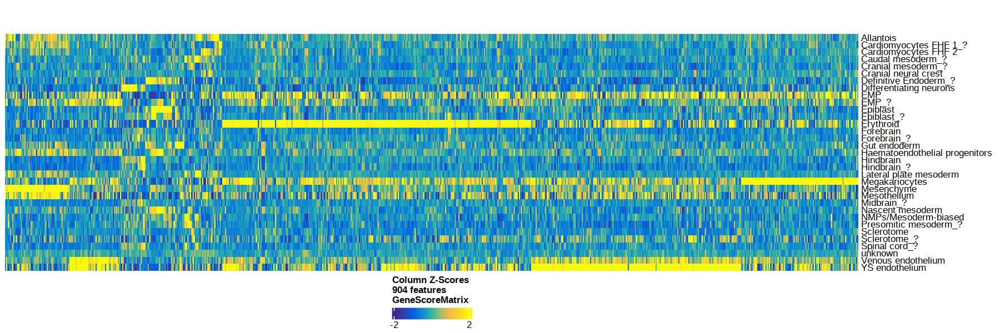

In [18]:
heatmapGS <- markerHeatmap(
  seMarker = markersGS, 
  cutOff = "FDR <= 0.01 & Log2FC >= 1.25", 
  labelMarkers = 'TAL1',
  transpose = TRUE
)
ComplexHeatmap::draw(heatmapGS, heatmap_legend_side = "bot", annotation_legend_side = "bot")

Getting ImputeWeights

2022-11-17 14:48:15 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:48:31 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:48:42 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:48:54 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:49:06 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:49:31 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:49:46 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-17 14:49:59 : SuppressedMessaged due to getArchRVerbose() is FALSE!



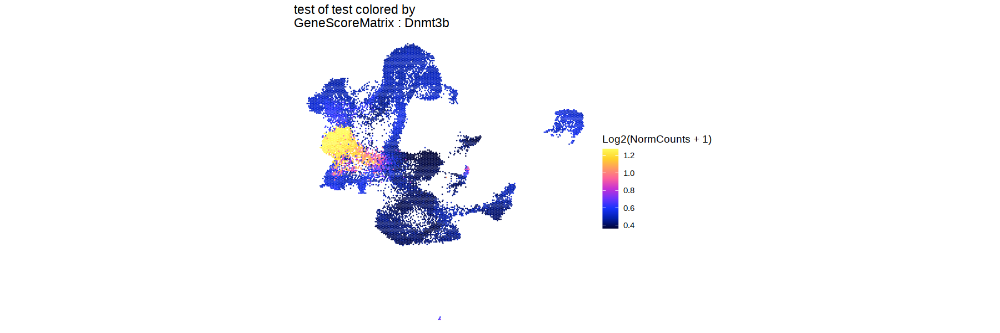

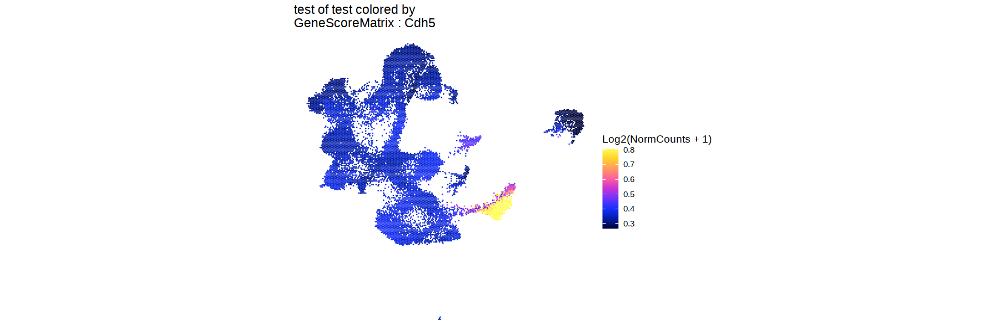

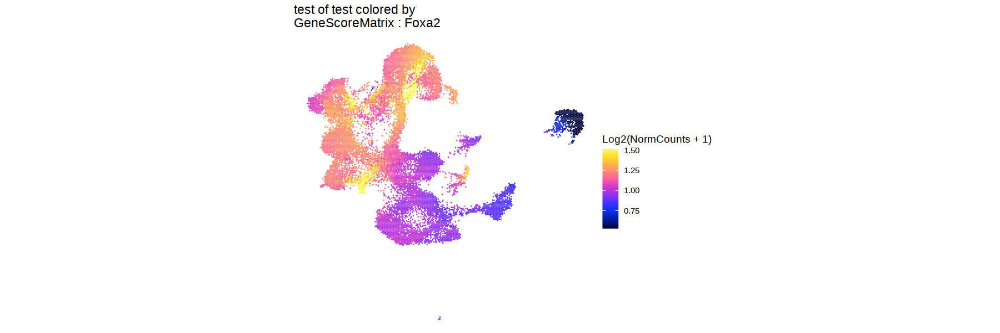

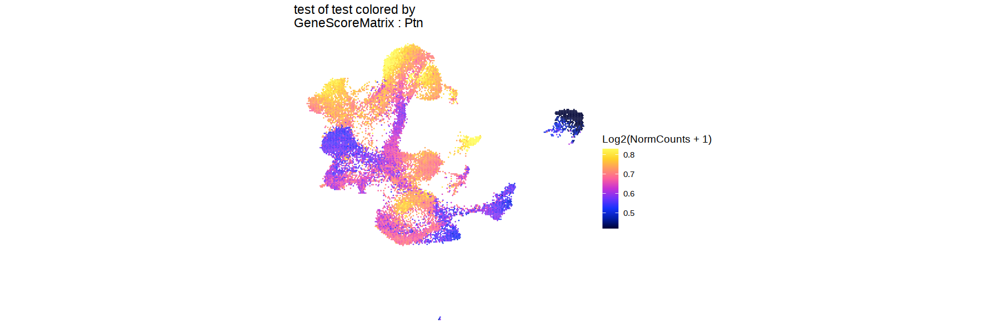

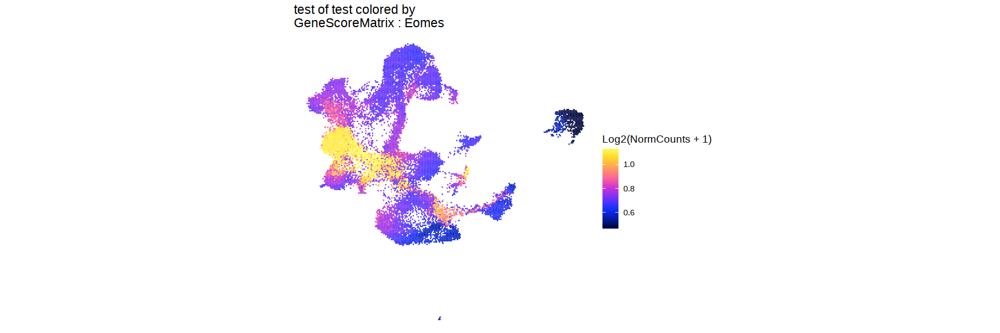

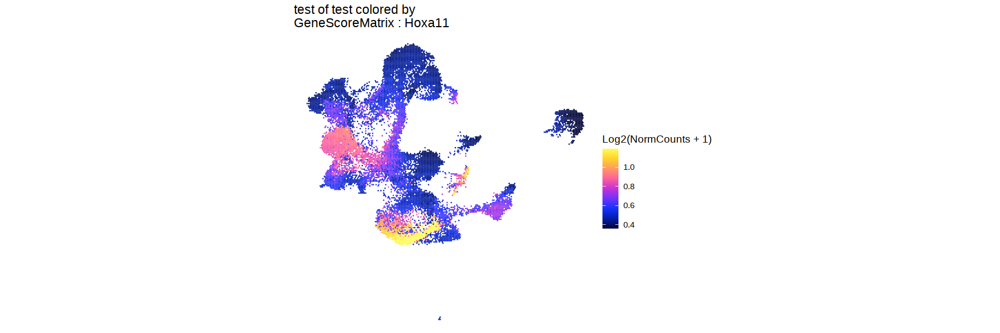

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]


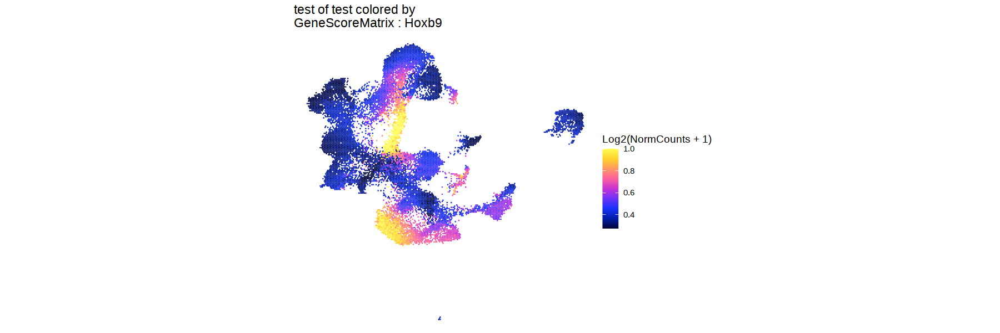

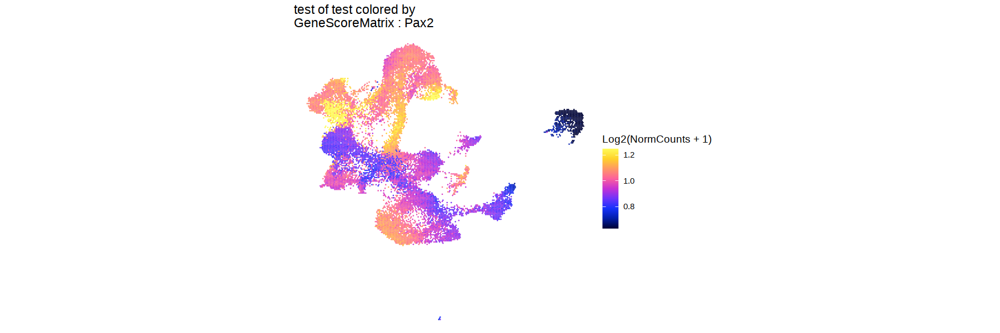

In [131]:
lapply(c("Dnmt3b", "Cdh5",  'Foxa2', 'Ptn', 'Eomes', 'Hoxa11', 'Hoxb9', 'Pax2'), function(gene){ # 
plotEmbedding(
    ArchRProj = ArchRProject, 
  embedding = "test",
  colorBy = 'GeneScoreMatrix',
  name = gene) + theme_void()
    })

In [148]:
umap_embedding.mtx <- umap(lsi.mtx, n_neighbors=25, min_dist=0.3, metric="cosine") %>% round(2)

In [149]:
umap_embedding.mtx = umap_embedding.mtx[match(metadata$cell, rownames(umap_embedding.mtx)),]

In [150]:
meta_umap = cbind(metadata, umap_embedding.mtx[,c(1,2)]) %>% setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))

In [151]:
plot_umap = function(column){
    meta_umap = meta_umap[,plot:=eval(parse(text=column))]
    
    labels = meta_umap[,list(median(UMAP1), median(UMAP2)), 
                                  by= plot] %>%
        setnames(c('V1', 'V2'), c('UMAP1', 'UMAP2'))
        
    
ggplot(meta_umap, aes(UMAP1, UMAP2, col=plot)) +
    geom_point(size=1, alpha=0.8) + 
    scale_color_manual(values = as.vector(c(ArchRPalettes[[3]],ArchRPalettes[[5]], ArchRPalettes[[8]],ArchRPalettes[[9]]))[1:length(unique(meta_umap$plot))]) + 
    ggrepel::geom_label_repel(data=labels, 
                                aes(label=plot, color=plot), 
                                max.overlaps=Inf,
                                box.padding = 0.4) + 
    theme_void() + 
    theme(legend.position='none')
}

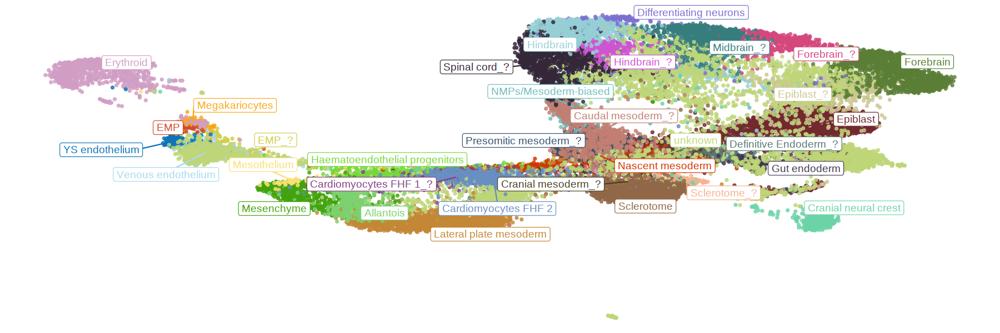

In [152]:
plot_umap('celltype_v1')

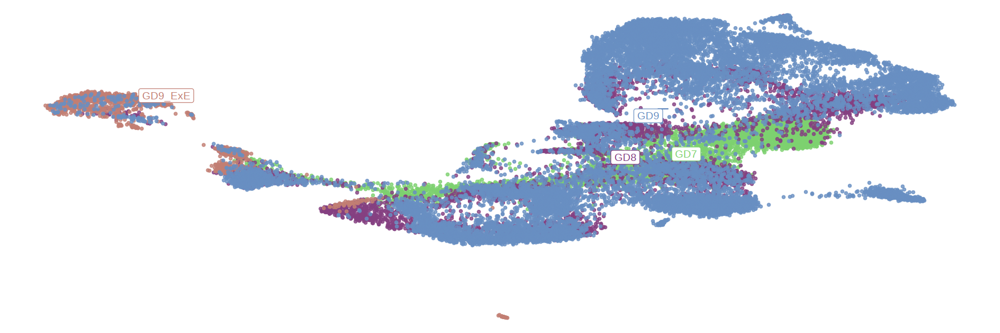

In [147]:
plot_umap('stage')

In [138]:
umap = as.data.frame(umap_embedding.mtx)
colnames(umap) = c('test#umap1', 'test#umap2')
ArchRProject@embeddings$test$df = umap

In [139]:
ArchRProject = addImputeWeights(ArchRProject, 'PeakMatrix')

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [86]:
markers2 = lapply(names(markerList), function(x){
    tmp = as.data.table(markerList[[x]]) %>% 
        .[c(1),c('name', 'Log2FC', 'FDR', 'MeanDiff')] %>%
        .[,celltype:=x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[!is.na(name),]
    

Getting ImputeWeights

2022-11-18 14:32:16 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:32:26 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:32:39 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:32:52 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:33:04 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:33:17 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:33:30 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:33:42 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:33:52 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Getting ImputeWeights

2022-11-18 14:34:05 : SuppressedMessaged due to getArchRVerbose() is FALSE!



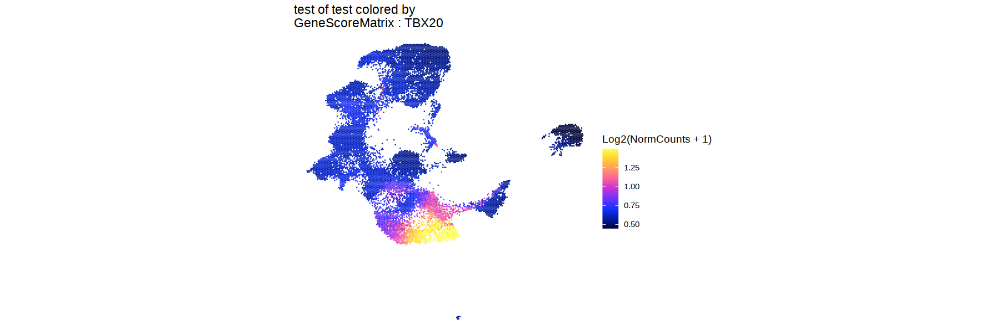

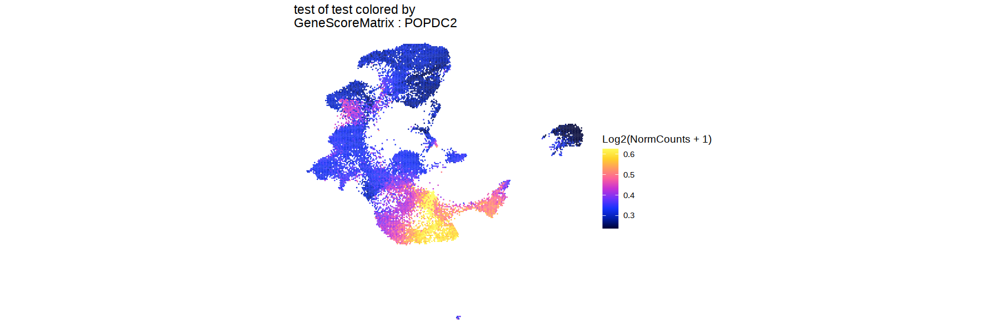

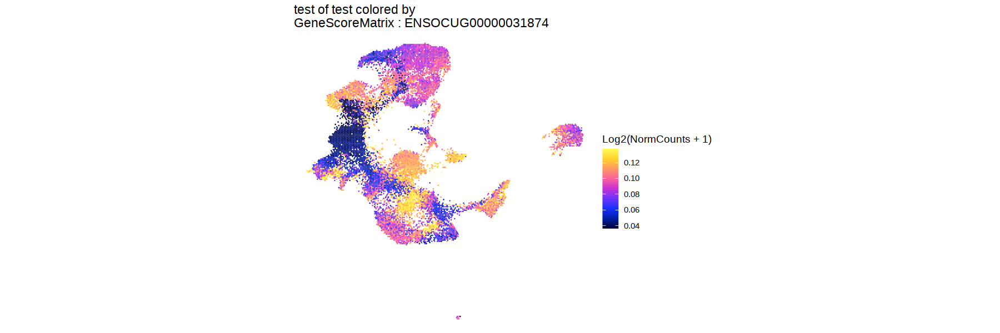

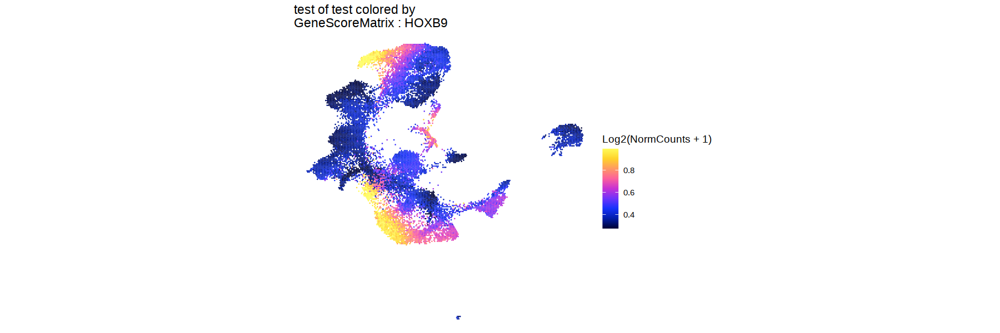

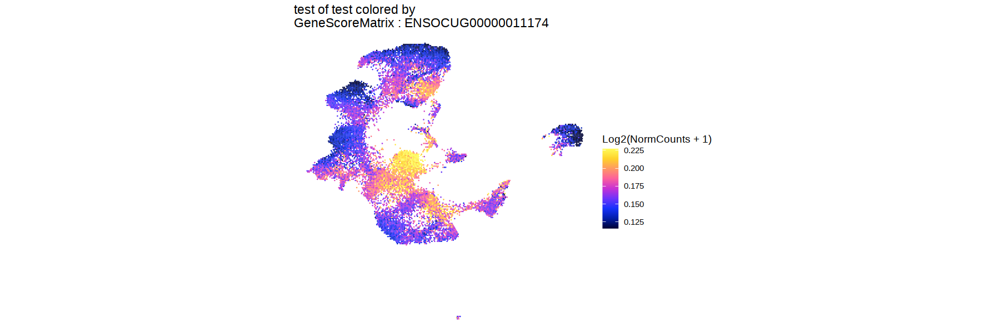

...

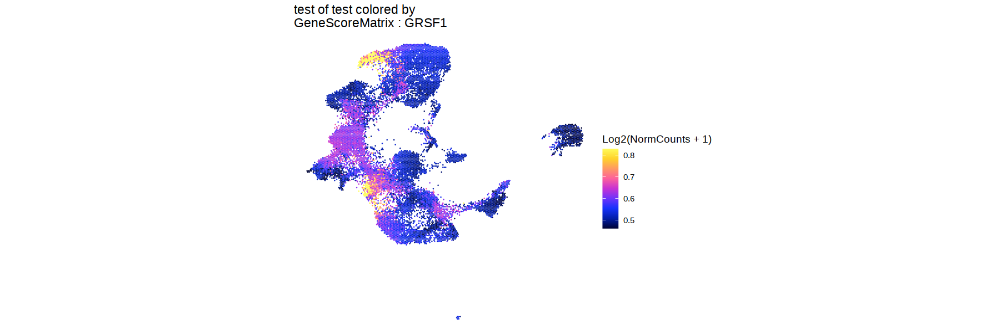

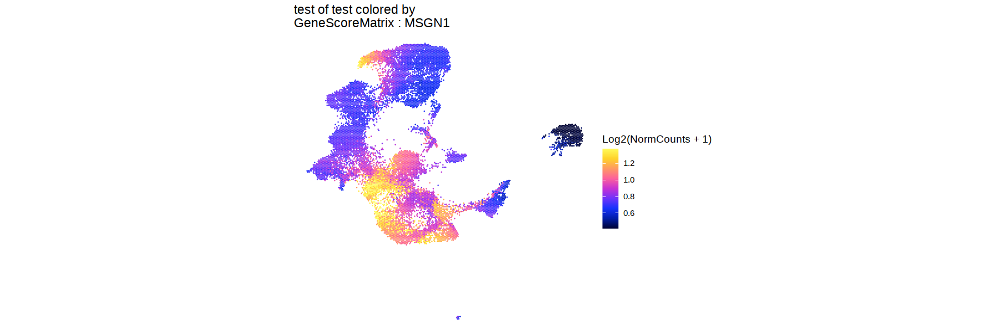

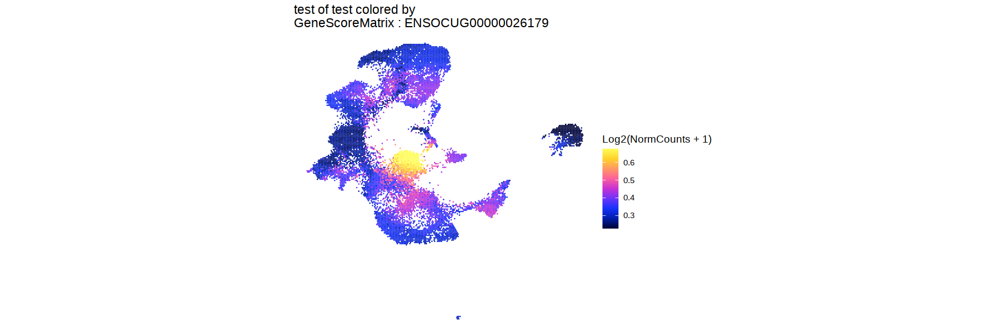

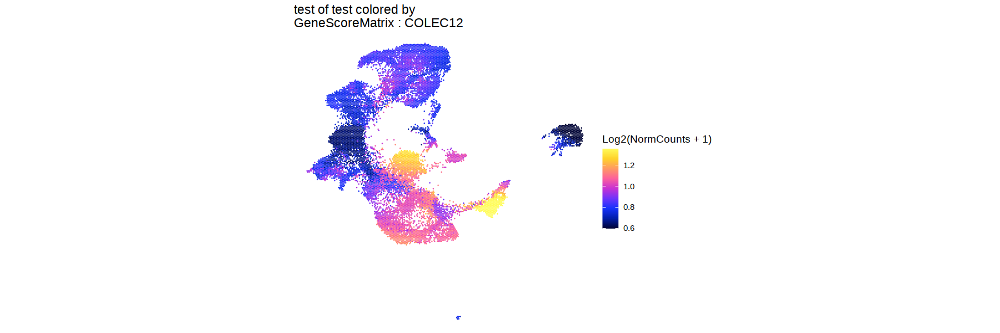

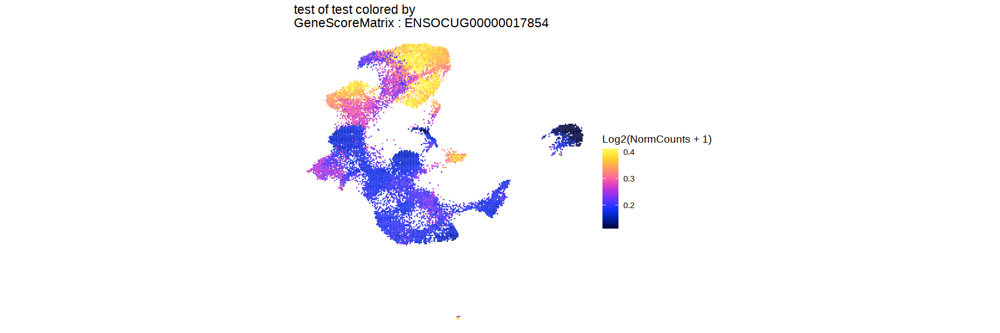

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]


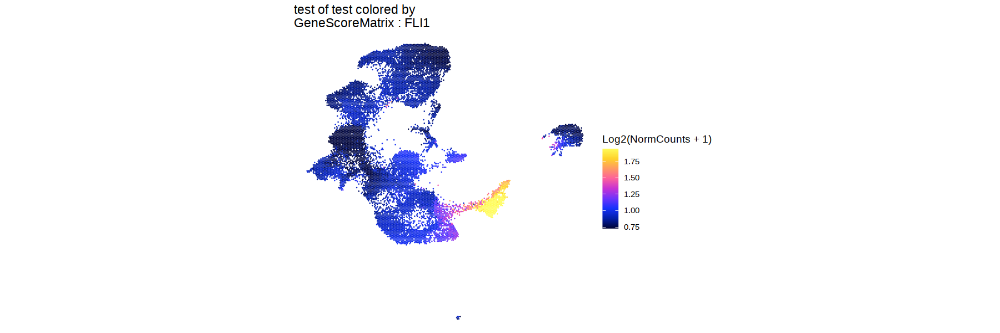

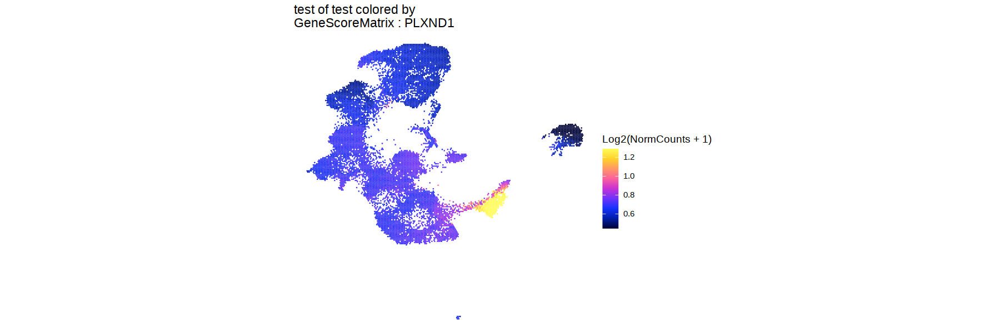

In [90]:
lapply(markers2$name, function(gene){ # 
plotEmbedding(
    ArchRProj = ArchRProject, 
  embedding = "test",
  colorBy = 'GeneScoreMatrix',
  name = gene) + theme_void()
    })